# **Analyzing Airbnb service in New York**
*Por: Carlos Vila Quispe*

## 1. Carga de Datos **(GitHub)**

In [120]:
import pandas as pd

path = 'https://github.com/CVilaNet/Visualizacion/raw/main/data/'
file = 'AB_NYC_2019.csv'
df = pd.read_csv(path + file)

df.shape

(48895, 16)

## 2. Exploración Preliminar

In [121]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [122]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

### Análsis Visual

In [123]:
import folium
print(folium.__version__)

0.12.1.post1


In [124]:
#!pip install folium --upgrade

In [125]:
# Import libraries
import pandas as pd
import folium
from folium import plugins

# Initialize the map:
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=11, tiles='openstreetmap')

# Trabajando con Marcadores, notamos que nubla la visualización
#for point in range(0, 1000):
#    folium.Marker(location=(df['latitude'][point], df['longitude'][point]), tooltip=df['host_name'][point]).add_to(folium_map)

plugins.FastMarkerCluster(data=list(zip(df['latitude'].values, df['longitude'].values))).add_to(folium_map)
folium.LayerControl(position='bottomleft', collapsed=False).add_to(folium_map)

folium_map

In [141]:
import folium
from folium import plugins

# Initialize the map:
#folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=11, tiles='CartoDB dark_matter')
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=10, tiles='openstreetmap')

#plot fastmarkercluster
plugins.FastMarkerCluster(data=list(zip(df['latitude'].values, df['longitude'].values)), name="FastMarkerCluster layer").add_to(folium_map)

# convert to (n, 2) nd-array format for heatmap
arr = df[['latitude', 'longitude']].values

# plot heatmap
plugins.HeatMap(arr, radius=16, name="Heatmap layer").add_to(folium_map)


#minimap
minimap = plugins.MiniMap()
folium_map.add_child(minimap)

folium.LayerControl(collapsed=False).add_to(folium_map)

#folium_map.save("plugins.html")
folium_map

In [134]:
!pip install pydeck

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [135]:
df_pdk = df[['longitude', 'latitude']]
df_pdk.rename(columns = {'longitude':'lng', 'latitude':'lat'}, inplace=True)
df_pdk.shape

/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:5039: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


(48895, 2)

In [136]:
import pydeck as pdk

# Define a layer to display on a map
layer = pdk.Layer(
    'HexagonLayer',
    df_pdk,
    get_position=['lng', 'lat'],
    auto_highlight=True,
    elevation_scale=50,
    pickable=True,
    elevation_range=[0, 3000],
    extruded=True,                 
    coverage=1)

# Set the viewport location
view_state = pdk.ViewState(
    longitude=-74.00597,
    latitude=40.71427,
    zoom=7,
    min_zoom=5,
    max_zoom=15,
    pitch=40.5,
    bearing=-27.36)

# Render
r = pdk.Deck(layers=[layer], initial_view_state=view_state)
r.to_html('demo.html', notebook_display=False)

<IPython.core.display.Javascript object>

## 3. Realizando una evaluación por precio

1. Bajo costo
2. Costo medio
3. Alto Costo



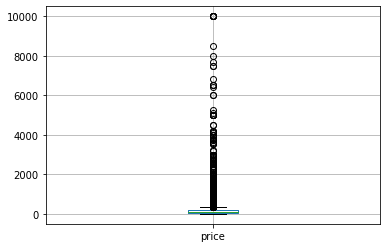

In [127]:
boxplot = df.boxplot(column=['price'])

In [128]:
df['price'].describe()

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

In [129]:
df['category'] = df['price'].apply(lambda x:'economic' if x<=106 else 'medium' if x<=1000 else 'gold')
df.shape

(48895, 17)

In [130]:
df_econ = df.query("category == 'economic'")
df_medi = df.query("category == 'medium'")
df_gold = df.query("category == 'gold'")
print('Economic Class : ' + str(df_econ.shape[0]))
print('Medium Class : ' + str(df_medi.shape[0]))
print('Gold Class : ' + str(df_gold.shape[0]))

Economic Class : 24472
Medium Class : 24184
Gold Class : 239


In [131]:
import folium
from folium import plugins

# Initialize the map:
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=10, tiles='openstreetmap')

#plot fastmarkercluster
plugins.FastMarkerCluster(data=list(zip(df_econ['latitude'].values, df_econ['longitude'].values)), name="FastMarkerCluster layer").add_to(folium_map)

# convert to (n, 2) nd-array format for heatmap
arr = df_econ[['latitude', 'longitude']].values

# plot heatmap
plugins.HeatMap(arr, radius=16, name="Heatmap layer").add_to(folium_map)

#minimap
minimap = plugins.MiniMap()
folium_map.add_child(minimap)

folium.LayerControl(collapsed=False).add_to(folium_map)

folium_map

In [132]:
import folium
from folium import plugins

# Initialize the map:
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=10, tiles='openstreetmap')

#plot fastmarkercluster
plugins.FastMarkerCluster(data=list(zip(df_medi['latitude'].values, df_medi['longitude'].values)), name="FastMarkerCluster layer").add_to(folium_map)

# convert to (n, 2) nd-array format for heatmap
arr = df_medi[['latitude', 'longitude']].values

# plot heatmap
plugins.HeatMap(arr, radius=16, name="Heatmap layer").add_to(folium_map)

#minimap
minimap = plugins.MiniMap()
folium_map.add_child(minimap)

folium.LayerControl(collapsed=False).add_to(folium_map)

folium_map

In [133]:
import folium
from folium import plugins

# Initialize the map:
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=10, tiles='openstreetmap')

#plot fastmarkercluster
plugins.FastMarkerCluster(data=list(zip(df_gold['latitude'].values, df_gold['longitude'].values)), name="FastMarkerCluster layer").add_to(folium_map)

# convert to (n, 2) nd-array format for heatmap
arr = df_gold[['latitude', 'longitude']].values

# plot heatmap
plugins.HeatMap(arr, radius=16, name="Heatmap layer").add_to(folium_map)

#minimap
minimap = plugins.MiniMap()
folium_map.add_child(minimap)

folium.LayerControl(collapsed=False).add_to(folium_map)

folium_map

## 4. Evaluando la demanda del tipo de habitación
1. Cuarto privado
2. Cuarto compartido
3. Casa/departamento completo



In [137]:
df_private = df.query("room_type == 'Private room'")
df_shared = df.query("room_type == 'Shared room'")
df_home = df.query("room_type == 'Entire home/apt'")
#df_home = df.query("(room_type == 'Entire home/apt') &( category == 'economic')")
print('Private room : ' + str(df_private.shape[0]))
print('Shared room : ' + str(df_shared.shape[0]))
print('Entire home : ' + str(df_home.shape[0]))

Private room : 22326
Shared room : 1160
Entire home : 25409


In [138]:
import folium
from folium import plugins

# Initialize the map:
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=10, tiles='openstreetmap')

#plot fastmarkercluster
plugins.FastMarkerCluster(data=list(zip(df_private['latitude'].values, df_private['longitude'].values)), name="FastMarkerCluster layer").add_to(folium_map)

# convert to (n, 2) nd-array format for heatmap
arr = df_private[['latitude', 'longitude']].values

# plot heatmap
plugins.HeatMap(arr, radius=16, name="Heatmap layer").add_to(folium_map)

#minimap
minimap = plugins.MiniMap()
folium_map.add_child(minimap)

folium.LayerControl(collapsed=False).add_to(folium_map)

folium_map

In [139]:
import folium
from folium import plugins

# Initialize the map:
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=10, tiles='openstreetmap')

#plot fastmarkercluster
plugins.FastMarkerCluster(data=list(zip(df_shared['latitude'].values, df_shared['longitude'].values)), name="FastMarkerCluster layer").add_to(folium_map)

# convert to (n, 2) nd-array format for heatmap
arr = df_shared[['latitude', 'longitude']].values

# plot heatmap
plugins.HeatMap(arr, radius=16, name="Heatmap layer").add_to(folium_map)

#minimap
minimap = plugins.MiniMap()
folium_map.add_child(minimap)

folium.LayerControl(collapsed=False).add_to(folium_map)

folium_map

In [140]:
import folium
from folium import plugins

# Initialize the map:
folium_map = folium.Map(location=[40.71427, -74.00597], zoom_start=10, tiles='openstreetmap')

#plot fastmarkercluster
plugins.FastMarkerCluster(data=list(zip(df_home['latitude'].values, df_home['longitude'].values)), name="FastMarkerCluster layer").add_to(folium_map)

# convert to (n, 2) nd-array format for heatmap
arr = df_home[['latitude', 'longitude']].values

# plot heatmap
plugins.HeatMap(arr, radius=16, name="Heatmap layer").add_to(folium_map)

#minimap
minimap = plugins.MiniMap()
folium_map.add_child(minimap)

folium.LayerControl(collapsed=False).add_to(folium_map)

folium_map

## 5. Evaluando por disponibilidad anual **(poca demanda)**
1. Altamente disponible (de poco uso)
2. Poco disponible (de uso medio)
3. Escasamente disponible

**CONCLUSIÓN:** Se concluye que la disponibilidad de las habitaciones no esta relacionada con el costo o el tipo de habitación ofertada para su renta

In [142]:
df['availability_365'].describe()

count    48895.000000
mean       112.781327
std        131.622289
min          0.000000
25%          0.000000
50%         45.000000
75%        227.000000
max        365.000000
Name: availability_365, dtype: float64

In [143]:
df['availability'] = df['availability_365'].apply(lambda x:'low' if x<=0 else 'medium' if x<=227 else 'high')
df.shape

(48895, 18)

In [144]:
df_low = df.query("availability == 'low'")
df_med = df.query("availability == 'medium'")
df_hig = df.query("availability == 'high'")
print('Low availability : ' + str(df_low.shape[0]))
print('Medium availability : ' + str(df_med.shape[0]))
print('High availability : ' + str(df_hig.shape[0]))

Low availability : 17533
Medium availability : 19159
High availability : 12203


#### Evaluando la **disponibilidad** según la **categoría** (costo de renta).

In [149]:
pd.crosstab(df.category, df.availability)

availability,high,low,medium
category,,,
economic,5512,9423,9537
gold,101,67,71
medium,6590,8043,9551


#### Evaluando la **disponibilidad** según el **tipo de habitación** (compartido, individual o casa/apartamento).

In [150]:
pd.crosstab(df.room_type, df.availability)

availability,high,low,medium
room_type,,,
Entire home/apt,6380,8876,10153
Private room,5379,8361,8586
Shared room,444,296,420
